<img src="https://cis.cnrs.fr/wp-content/uploads/2020/03/logo-sobigdata.png" width="180px" align="right"/>
<h1><a href='https://doi.org/10.5281/zenodo.6360651'>Multi-aspect Integrated Migration Indicators (MIMI) dataset</a></h1>
<span>
<br/>
<img src="https://hummingbird-h2020.eu/phantasy-root-skin/hummingbird_logo_120h.png" width="180px" align="right"/>
<b>Funding:</b> this research was funded by <a href=''>HumMingBird</a> and <a href=''>SoBigData</a>.<br/>
<b>Author:</b> <a href="https://dilettagoglia.netlify.app/">Diletta Goglia</a><br/>
<b>Python version:</b>  3.8.10<br/>
<b>Date created:</b> March 2022
</span>

## Example of data extraction and analysis on MIMI dataset

### Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import holoviews as hv
import statistics 
from scipy.stats import kendalltau, pearsonr, spearmanr
import seaborn as sns
import matplotlib.patches as mpatches
import math

### Download dataset
Choose a local directory where you prefer to save the dataset and download it from Zenodo at the following link: https://doi.org/10.5281/zenodo.6360651 .

Save the local path to directory in the variable "path". For example:

In [2]:
path = 'C:/Users/User/Desktop/mimi_final_dataset.csv' # substitute this with your local path to the dataset

In [4]:
mimi = pd.read_csv(path, index_col=[1], sep=",", low_memory=False) # read csv file

## 1. Social Connectedness Index

In [5]:
mimi.sci.describe()

count    2.872500e+04
mean     3.099098e+04
std      4.902446e+05
min      2.200000e+01
25%      2.200000e+01
50%      3.860000e+02
75%      2.080000e+03
max      3.180508e+07
Name: sci, dtype: float64

Text(0.5, 1.0, 'SCI distribution')

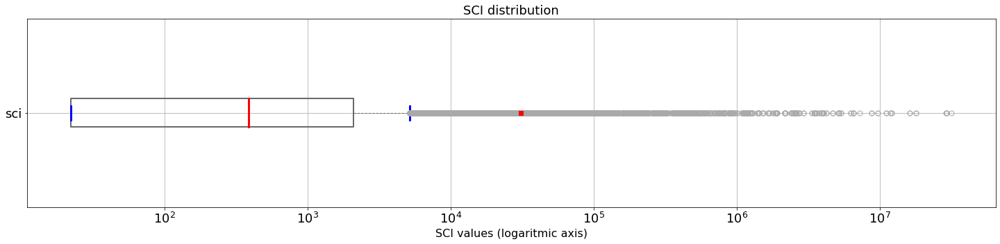

In [6]:
plt.figure(figsize=(25, 5))
boxprops = dict(linestyle='-', linewidth=2, color='dimgray')
medianprops = dict(linestyle='-', linewidth=3, color='red')
whiskerprops = dict(linestyle='--', linewidth=1, color='dimgray')
capprops=dict(linestyle='-', linewidth=3, color='blue')
flierprops=dict(linestyle='-', color='none', markerfacecolor='none', markersize=7, markeredgecolor='darkgrey')
meanprops={"marker":"s","markerfacecolor":"red", "markeredgecolor":"red"}

mimi.boxplot(column='sci', vert=False, boxprops=boxprops, flierprops=flierprops, medianprops=medianprops, whiskerprops=whiskerprops,
             capprops=capprops, meanprops=meanprops, showmeans=True, showfliers=True, grid=True)
plt.xscale('symlog')
plt.tick_params(axis='y', labelsize=18)
plt.tick_params(axis='x', labelsize=18)
plt.xlabel('SCI values (logaritmic axis)', fontsize=16)
plt.title('SCI distribution', fontsize=18)

***

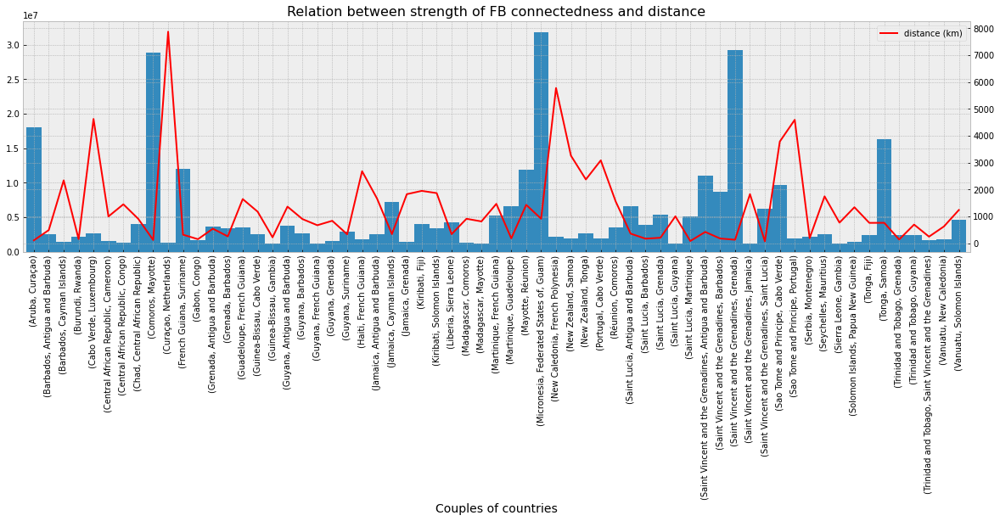

In [7]:
q = 0.996 # quantile

plt.figure(figsize=(20, 5))
matplotlib.style.use('bmh') 

df = mimi[mimi.sci > mimi.sci.quantile(q)].drop_duplicates(subset='sci', keep="first")

df.sci.groupby([mimi.origin_name, mimi.destination_name]).agg('max').plot(kind="bar", width=1.0, label='sci')
plt.xlabel("Couples of countries", fontsize=14)
plt.twinx()
df.geodesic_distance_km.groupby([mimi.origin_name, mimi.destination_name]).agg('max').plot(color='r', label='distance (km)')


plt.xticks(rotation=90, horizontalalignment="center", fontsize=12)
plt.title("Relation between strength of FB connectedness and distance", fontsize=16)
plt.legend()

The barplot shows the strenght of social connectedness for couples of countries having SCI above the chosen quantile "q". The red line indicates, for each couple, the distance expressed in kilometers.

***

In [8]:
sci_table = pd.pivot_table(mimi, values='sci', index=['origin_cont_code'], columns=['destination_cont_code'], aggfunc={'sci': np.mean})

In [9]:
sci_table

destination_cont_code,AF,AQ,AS,EU,OC,SA
origin_cont_code,,,,,,
AF,193451.796468,NaN,3685.149606,6413.268190,852.592920,1230.521951
AQ,NaN,NaN,NaN,22.000000,NaN,NaN
AS,3652.803672,NaN,16262.749004,2257.969163,2079.975104,299.873508
EU,7358.251216,22.0,2310.122992,27536.769762,1310.790747,2232.409968
OC,638.688453,NaN,1666.575258,955.871456,326769.922680,285.326829
SA,1018.345277,NaN,291.090090,1844.525478,3154.761364,188556.360000


In [10]:
table_cont = pd.DataFrame(sci_table.unstack()).reset_index()
table_cont = table_cont.rename(columns={0:'sci'})
table_cont['sci'].fillna(0.1, inplace=True)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
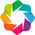

In [11]:
hv.extension("bokeh")

In [12]:
cmap='accent'

In [13]:
%%opts Chord [height=600 width=600, labels="continent" title='Facebook strenght of connectedness among continents' ]
%%opts Chord (node_color="continent" node_cmap=cmap edge_color="origin_cont_code" edge_cmap=cmap)

countries = list(set(table_cont["origin_cont_code"].unique().tolist() + table_cont["destination_cont_code"].unique().tolist()))
countries_chord = hv.Dataset(pd.DataFrame(countries, columns=["continent"]))

hv.Chord((table_cont, countries_chord)).opts(label_text_font_size='12pt')

:Chord   [destination_cont_code,origin_cont_code]   (sci)

The chord diagram displays Facebook strenght of connectedness among continents (averaged aggregation of sci for each
couple of countries in the continent).

## 2. Migration flows

### 2.1. Chord diagrams 

#### EUROSTAT migration flows

Choose an year between 2010 and 2019 and assign it to "y" variable.

In [14]:
y = 2016 # substitute year

In [15]:
def buildChord(df, val, idx, col):
    table = pd.pivot_table(df, values=val, index=[idx], columns=[col], aggfunc='sum')
    table = pd.DataFrame(table.unstack()).reset_index()
    table = table.rename(columns={0:'migr_flow_total_sum'})
    table['migr_flow_total_sum'].fillna(1, inplace=True)
    table.replace(0,1,inplace=True)
    return table

In [16]:
eurostat_flows =  mimi[mimi[f'ESTAT_{str(y)}_T_T'] > 15000].sort_values(by=f'ESTAT_{str(y)}_T_T', ascending=False)
eurostat_chord = buildChord(eurostat_flows, f'ESTAT_{str(y)}_T_T', 'origin_name', 'destination_name')

In [17]:
%%opts Chord [height=600 width=600, labels="mig", title=f'ESTAT country-to-country flows in {str(y)}']
%%opts Chord (node_color="mig" node_cmap=cmap edge_color="origin_name" edge_cmap=cmap)

c = list(set(eurostat_chord["origin_name"].unique().tolist() + eurostat_chord["destination_name"].unique().tolist()))
countries_chord = hv.Dataset(pd.DataFrame(c, columns=["mig"]))

hv.Chord((eurostat_chord, countries_chord)).opts(label_text_font_size='12pt')

:Chord   [destination_name,origin_name]   (migr_flow_total_sum)

The plot illustrates EUROSTAT bilateral migration flows in the selected year : pairs of countries with the highest numbers of migrants sharing (over the treshold of 15,000).

***

In [18]:
eurostat_continent_chord = buildChord(mimi, f'ESTAT_{str(y)}_T_T', 'origin_cont_code', 'destination_cont_code')

In [19]:
%%opts Chord [height=600 width=600, labels="mig" title=f'Inter-continental migration flows from EUROSTAT in {str(y)}']
%%opts Chord (node_color="mig" node_cmap=cmap edge_color="origin_cont_code" edge_cmap=cmap)

c_20 = list(set(eurostat_continent_chord["origin_cont_code"].unique().tolist() + 
                eurostat_continent_chord["destination_cont_code"].unique().tolist()))
countries_chord = hv.Dataset(pd.DataFrame(c_20, columns=["mig"]))

hv.Chord((eurostat_continent_chord, countries_chord)).opts(label_text_font_size='12pt')


:Chord   [destination_cont_code,origin_cont_code]   (migr_flow_total_sum)

The diagram illustrates bidirectional international mobility between pairs of continents (where values are aggregated as total sum of EUROSTAT migration flows shared by pairs of countries in the given continent).

#### UN migration flows

Choose an year between 2010 and 2020 and assign it to "y" variable.

In [20]:
y = 2016 # substitute year

In [21]:
un_flows =  mimi[mimi[f'UN_{str(y)}_T_T'] > 30000].sort_values(by=f'UN_{str(y)}_T_T', ascending=False)
un_chord = buildChord(un_flows, f'UN_{str(y)}_T_T', 'origin_name', 'destination_name')

In [22]:
%%opts Chord [height=600 width=600, labels="mig", title=f'UN country-to-country flows in {str(y)}']
%%opts Chord (node_color="mig" node_cmap=cmap edge_color="origin_name" edge_cmap=cmap)

c = list(set(un_chord["origin_name"].unique().tolist() + un_chord["destination_name"].unique().tolist()))
countries_chord = hv.Dataset(pd.DataFrame(c, columns=["mig"]))

hv.Chord((un_chord, countries_chord)).opts(label_text_font_size='12pt')

:Chord   [destination_name,origin_name]   (migr_flow_total_sum)

The plot illustrates UN bilateral migration flows in the selected year : pairs of countries with the highest numbers of migrants sharing (over the treshold of 30,000).

***

In [23]:
un_continent_chord = buildChord(mimi, f'UN_{str(y)}_T_T', 'origin_cont_code', 'destination_cont_code')

In [24]:
%%opts Chord [height=600 width=600, labels="mig" title=f'Inter-continental migration flows from UN in {str(y)}']
%%opts Chord (node_color="mig" node_cmap=cmap edge_color="origin_cont_code" edge_cmap=cmap)

c_20 = list(set(un_continent_chord["origin_cont_code"].unique().tolist() + 
                un_continent_chord["destination_cont_code"].unique().tolist()))
countries_chord = hv.Dataset(pd.DataFrame(c_20, columns=["mig"]))

hv.Chord((un_continent_chord, countries_chord)).opts(label_text_font_size='12pt')


:Chord   [destination_cont_code,origin_cont_code]   (migr_flow_total_sum)

The diagram illustrates bidirectional international mobility between pairs of continents (where values are aggregated as total sum of UN migration flows shared by pairs of countries in the given continent).

### 2.2. Boxplots

In [25]:
boxprops = dict(linestyle='-', linewidth=2, color='dimgray')
medianprops = dict(linestyle='-', linewidth=3, color='mediumvioletred')
whiskerprops = dict(linestyle='--', linewidth=1, color='dimgray')
capprops=dict(linestyle='-', linewidth=3, color='mediumvioletred')
flierprops=dict(linestyle='-', color='none', markerfacecolor='none', markersize=7, markeredgecolor='darkgrey')
meanprops={"marker":"s","markerfacecolor":"red", "markeredgecolor":"red"}

In [26]:
boxprops_m = dict(linestyle='-', linewidth=2, color='dimgray')
medianprops_m = dict(linestyle='-', linewidth=3, color='steelblue')
whiskerprops_m = dict(linestyle='--', linewidth=1, color='dimgray')
capprops_m=dict(linestyle='-', linewidth=3, color='steelblue')

#### EUROSTAT migration flows

(-0.1, 100000.0)

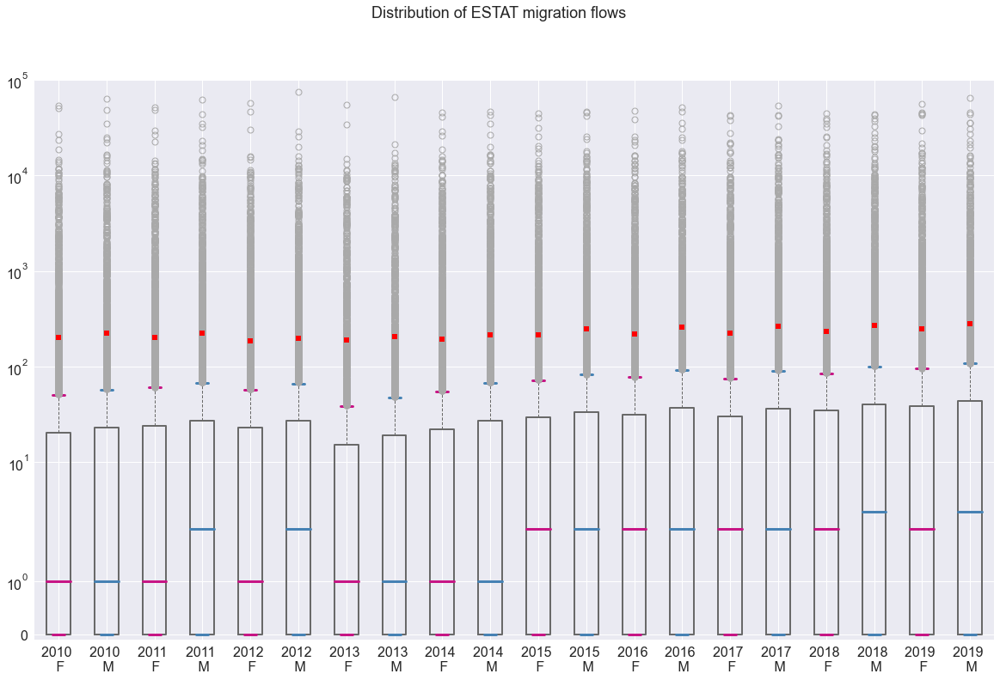

In [27]:
matplotlib.style.use('seaborn') 

col=[]
labels=[]
for i in range(2010,2020):
    for j in ['F', 'M']:
        col.append(f'ESTAT_{str(i)}_{(j)}_T')
        labels.append(f'{str(i)} \n {(j)}')

female = mimi.boxplot(column=col[::2],positions=[p for p in range(1,21,2)],
            boxprops=boxprops, flierprops=flierprops, medianprops=medianprops, whiskerprops=whiskerprops, capprops=capprops,
            meanprops=meanprops, showmeans=True, showfliers=True, grid=True, rot=0,figsize=(20,12))

plt.suptitle('Distribution of ESTAT migration flows', fontsize=18)

male = mimi.boxplot(column=col[1::2],positions=[p for p in range(2,22,2)],
            boxprops=boxprops_m, flierprops=flierprops, medianprops=medianprops_m, whiskerprops=whiskerprops_m, 
            capprops=capprops_m, meanprops=meanprops, showmeans=True,  showfliers=True, grid=True,figsize=(20,12))

plt.xticks(ticks=[x for x in range(1,21)], labels=labels, fontsize=16)
female.tick_params(axis='y', labelsize=16)
plt.yscale('symlog')
plt.ylim(-10*1e-2,10*1e4)

#### UN migration flows

(-0.1, 10000000.0)

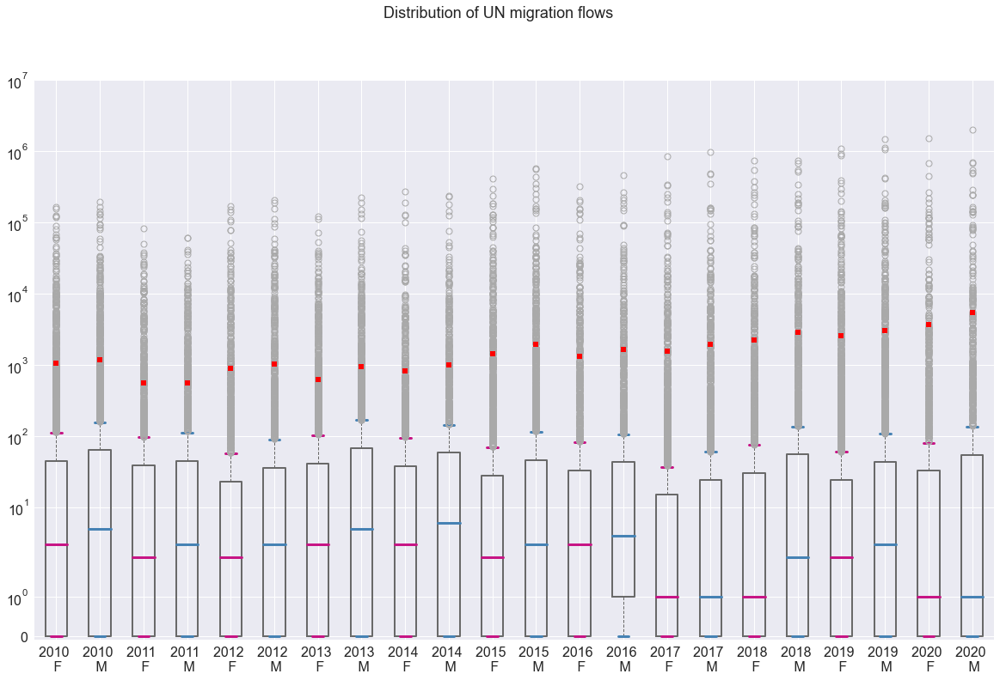

In [28]:
matplotlib.style.use('seaborn') 

col=[]
labels=[]
for i in range(2010,2021):
    for j in ['F', 'M']:
        col.append(f'UN_{str(i)}_{(j)}_T')
        labels.append(f'{str(i)} \n {(j)}')

female = mimi.boxplot(column=col[::2],positions=[p for p in range(1,22,2)],
            boxprops=boxprops, flierprops=flierprops, medianprops=medianprops, whiskerprops=whiskerprops, capprops=capprops,
            meanprops=meanprops, showmeans=True, showfliers=True, grid=True, rot=0,figsize=(20,12))

plt.suptitle('Distribution of UN migration flows', fontsize=18)

male = mimi.boxplot(column=col[1::2],positions=[p for p in range(2,23,2)],
            boxprops=boxprops_m, flierprops=flierprops, medianprops=medianprops_m, whiskerprops=whiskerprops_m, 
            capprops=capprops_m, meanprops=meanprops, showmeans=True,  showfliers=True, grid=True,figsize=(20,12))

plt.xticks(ticks=[x for x in range(1,23)], labels=labels, fontsize=16)
female.tick_params(axis='y', labelsize=16)
plt.yscale('symlog')
plt.ylim(-10*1e-2,10*1e6)

## 3. Migration stocks

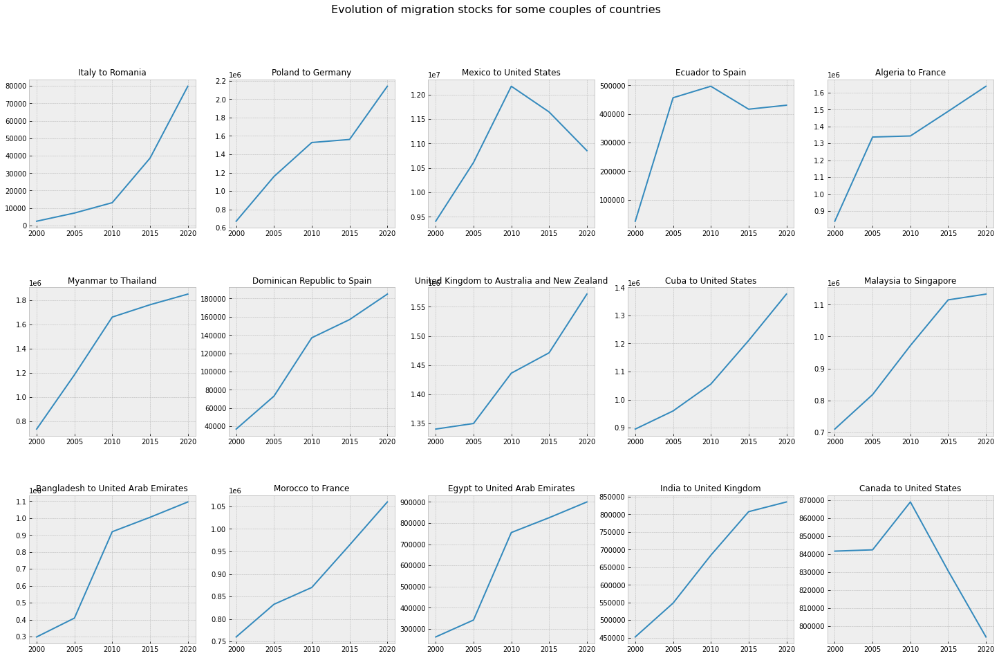

In [29]:
sns.reset_orig()
matplotlib.style.use('bmh') 
fig, ax = plt.subplots(3, 5, figsize=(25,15))

couples=[['IT-RO', 'PL-DE', 'MX-US', 'EC-ES', 'DZ-FR'],
         ['MM-TH', 'DO-ES', 'GB-QS', 'CU-US', 'MY-SG'],
         ['BD-AE', 'MA-FR', 'EG-AE', 'IN-GB', 'CA-US']]

years = range(2000,2025,5)

for i in range(len(couples)): # 3 rows
    list_=[]
    for j in range(5): # 5 cols
        temp = mimi[mimi.index==couples[i][j]]
        list_ = [temp[f'UN_migr_stocks_{str(years[v])}_T_T'] for v in range(len(years))]
        ax[i, j].plot(years, list_)
        ax[i, j].set_title(f'{temp.origin_name[0]} to {temp.destination_name[0]}', fontsize=12)

plt.suptitle('Evolution of migration stocks for some couples of countries', fontsize=16)
plt.subplots_adjust(wspace=0.2, hspace=0.4)

The plot displays the change in absolute number of migrant for stocks, for some couples of countries.

***

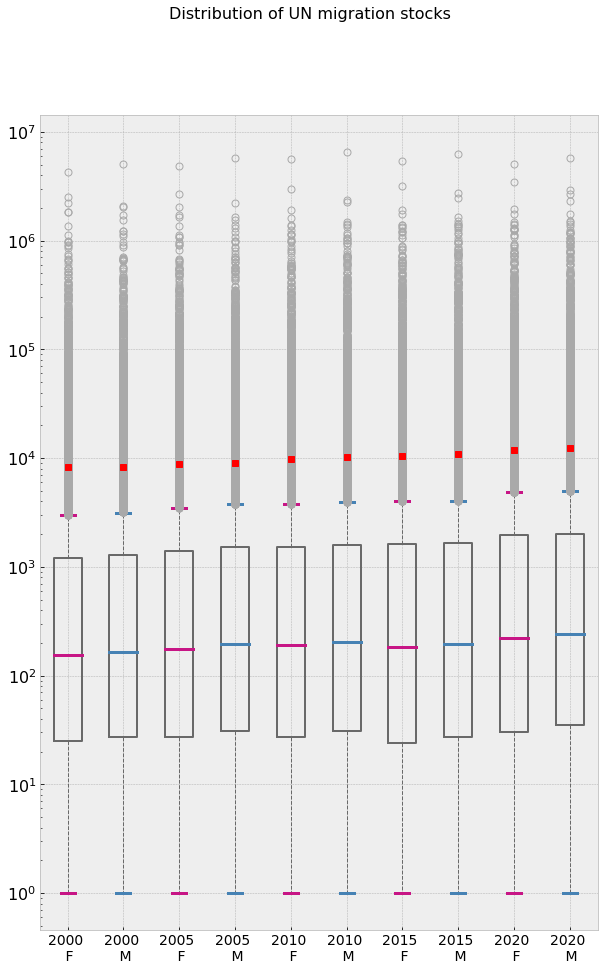

In [30]:
col=[]
labels=[]
for i in range(2000,2025,5):
    for j in ['F', 'M']:
        col.append(f'UN_migr_stocks_{str(i)}_{(j)}_T')
        labels.append(f'{str(i)} \n {(j)}')

female = mimi.boxplot(column=col[::2],positions=[p for p in range(1,10,2)],
            boxprops=boxprops, flierprops=flierprops, medianprops=medianprops, whiskerprops=whiskerprops,
            capprops=capprops, meanprops=meanprops, showmeans=True,  showfliers=True, grid=True, rot=0,figsize=(10,15))

male = mimi.boxplot(column=col[1::2],positions=[p for p in range(2,11,2)],
            boxprops=boxprops_m, flierprops=flierprops, medianprops=medianprops_m, whiskerprops=whiskerprops_m, 
            capprops=capprops_m, meanprops=meanprops, showmeans=True,  showfliers=True, grid=True, rot=0,figsize=(10,15))

plt.yscale('log')
plt.xticks(ticks=[x for x in range(1,11)], labels=labels, fontsize=14)
plt.suptitle('Distribution of UN migration stocks', fontsize=16)
female.tick_params(axis='y', labelsize=16)

## 4. Net migration rate

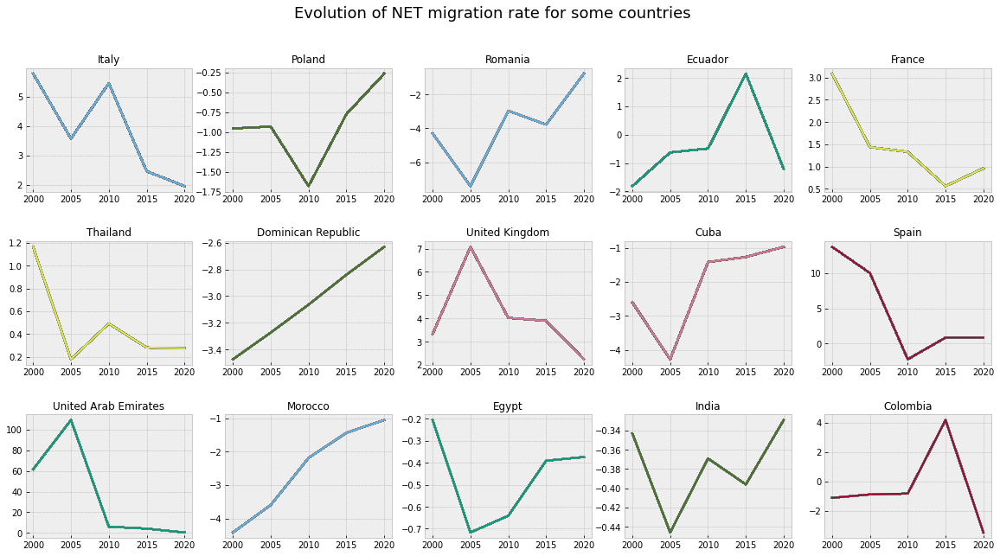

In [31]:
fig, ax = plt.subplots(3, 5, figsize=(20,10))
matplotlib.style.use('bmh')

country=[['IT', 'PL', 'RO', 'EC', 'FR'],
         ['TH', 'DO', 'GB', 'CU', 'ES'],
         ['AE', 'MA', 'EG', 'IN', 'CO']]

years = range(2000,2025,5)
for i in range(len(country)): # 3 rows
    list_=[]
    for j in range(5): # 5 cols
        temp = mimi[mimi.origin_country==country[i][j]]
        list_ = [temp[f'UN_origin_net_migr_rate_{str(years[v])}-{str(years[v]+5)}'] for v in range(len(years))]
        ax[i, j].plot(years, list_)
        ax[i, j].set_title(f'{temp.origin_name[0]}', fontsize=12)
plt.suptitle('Evolution of NET migration rate for some countries', fontsize=18)
plt.subplots_adjust(wspace=0.2, hspace=0.4)

The plot displays the change of NET migration rate over time for some countries.

## 5. Percentage of facebook users

Text(0, 0.5, 'Percentage (users/population)')

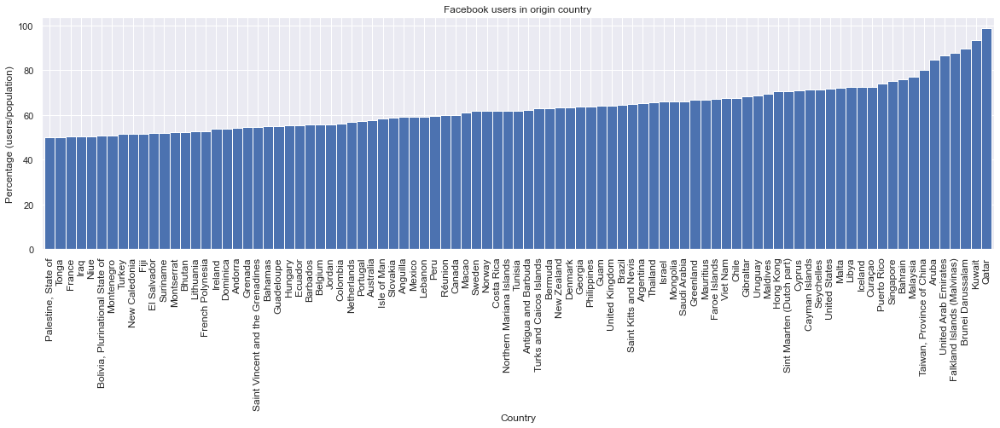

In [32]:
plt.figure(figsize=(20, 5))
matplotlib.style.use('fivethirtyeight') 
sns.set()

mimi[mimi.origin_fb_users_perc>50].origin_fb_users_perc.groupby([mimi.origin_name]).agg('max').sort_values().plot(kind="bar", width=1.0)

plt.xticks(rotation=90, horizontalalignment="center", fontsize=12)
plt.title("Facebook users in origin country")
plt.xlabel("Country")
plt.ylabel("Percentage (users/population)")

The barplot illustrates countries having more than 50% of facebook users over the total population.

## 6. Cultural Indicators

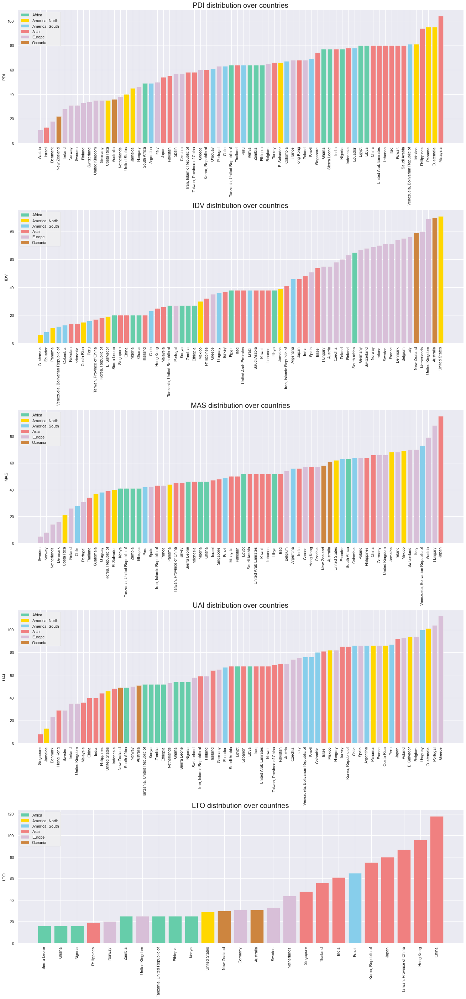

In [33]:
sns.set()
fig, ax = plt.subplots(nrows=5, figsize=(20, 45))
matplotlib.style.use('fivethirtyeight') 
fig.subplots_adjust(hspace=0.5)

cult_dist = ['PDI', 'IDV','MAS', 'UAI', 'LTO']

# color map
mimi['cont_num'] = mimi['destination_cont_code']
mimi['cont_num'] = mimi['cont_num'].replace(['AS', 'AQ', 'EU', 'SA', 'OC', 'AF', 'NA', math.nan],
                                            ['lightcoral', 'grey', 'thistle',  'skyblue', 'peru', 'mediumaquamarine', 'gold', 'gold'])

patch_7 = mpatches.Patch(color='mediumaquamarine', label='Africa')
patch_5 = mpatches.Patch(color='gold', label='America, North')    
patch_4 = mpatches.Patch(color='skyblue', label='America, South')
patch_1 = mpatches.Patch(color='lightcoral', label='Asia')
patch_3 = mpatches.Patch(color='thistle', label='Europe')
patch_6 = mpatches.Patch(color='peru', label='Oceania')

for i in range(len(cult_dist)):
    
    df = mimi[mimi[f'destination_{str(cult_dist[i])}'].apply(abs) > 0]
    
    plotting_data = df[f'destination_{str(cult_dist[i])}'].groupby([df.destination_name, df.cont_num]).agg('mean').sort_values()
    plotting_data = plotting_data.to_frame()
    plotting_data = pd.DataFrame(plotting_data.to_records())
    
    ax[i].bar(plotting_data.destination_name, plotting_data[f'destination_{str(cult_dist[i])}'], color=plotting_data.cont_num)
    ax[i].set_title(f"{cult_dist[i]} distribution over countries")
    ax[i].set_xlabel("")
    ax[i].set_ylabel(cult_dist[i])
    
    ax[i].legend(handles=[patch_7, patch_5, patch_4, patch_1, patch_3, patch_6])
    for tick in ax[i].get_xticklabels():
        tick.set_rotation(90)

The barplots show the distribution of each cultural dimension over countries, divided by continent.

## 7. Correlations
P-values have been computed in order to confirm of refute the relevance of each correlation value: results are indicated with a number of asterisks proportional to the relevance obtained.

- no asterisks means no relevance: p-value > 0.5 

- \* means little relevance: p-value < 0.5 

- \** means medium relevance: p-value < 0.1 

- \*** means high relevance: p-value < 0.01 

In [34]:
def kendall_pval(x,y):
    return kendalltau(x,y)

def pearsonr_pval(x,y):
    return pearsonr(x,y)

def spearmanr_pval(x,y):
    return spearmanr(x,y)

In [35]:
def computeCorr(c1, c2, method):
    columns = c1+c2
    corr = mimi[columns].corr(method=method)
    corr.drop(c2, inplace=True)
    corr = corr[c2]
    x_axis_labels = [item.replace("destination_", "") for item in c2] 
    y_axis_labels = [item.replace("destination_", "") for item in c1] 
    return corr, x_axis_labels, y_axis_labels

In [36]:
def createCorrMatrix(col_i, col_j, method):
    matrix = [[0] * len(col_j) for x in range(len(col_i))]
    for i in range(len(col_i)):
        for j in range(len(col_j)):
            corr = mimi[col_i[i]].corr(mimi[col_j[j]], method = method)
            if corr is None:
                corr = (math.nan, 1)
            if (corr[1] < 0.5) & (corr[1] > 0.1): 
                matrix[i][j] = str(round(corr[0], 3)) + ' *'
            if (corr[1] < 0.1) & (corr[1] > 0.01): 
                matrix[i][j] = str(round(corr[0], 3)) + ' **'
            if (corr[1] < 0.01):
                matrix[i][j] = str(round(corr[0], 3)) + ' ***'
            else: 
                matrix[i][j] = str(round(corr[0], 3)) # p-values > 0.5
    return matrix

In [37]:
sns.set()

### 7.1. Pearson correlation between NET migration rate and GDP

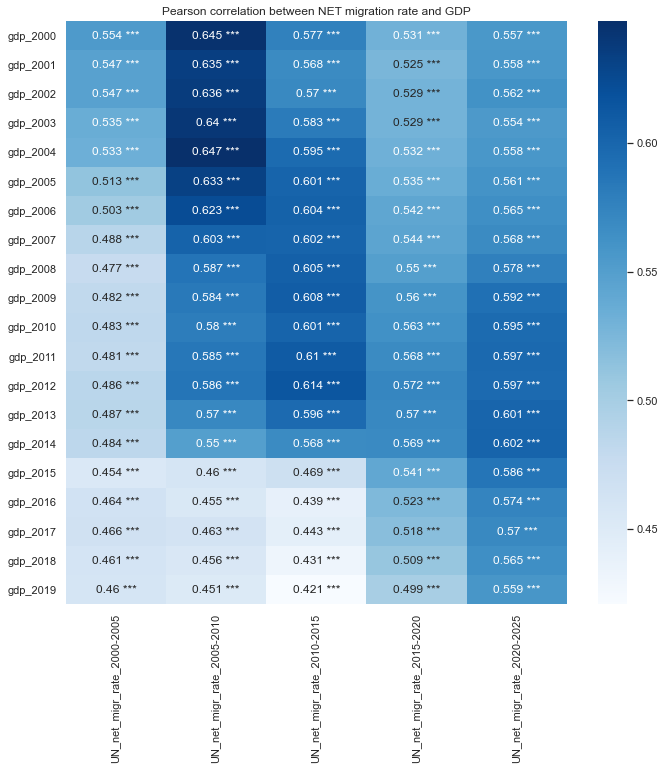

In [38]:
rows=['UN_destination_net_migr_rate_2000-2005',
 'UN_destination_net_migr_rate_2005-2010',
 'UN_destination_net_migr_rate_2010-2015',
 'UN_destination_net_migr_rate_2015-2020',
 'UN_destination_net_migr_rate_2020-2025']

cols=[]
for i in range(2000, 2020):
    cols.append(f'destination_gdp_{str(i)}')

gdp_corr, x_axis_labels, y_axis_labels = computeCorr(cols, rows, 'pearson')
matr_GDP = createCorrMatrix(cols, rows, pearsonr_pval)

plt.figure(figsize=(10,10))
sns.heatmap(gdp_corr, cmap="Blues", annot=matr_GDP, fmt='', xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.title('Pearson correlation between NET migration rate and GDP')
plt.show()

### 7.2. Spearman correlation between EUROSTAT flows and UN stocks 

Select desired value for "sex" variable ('T', 'F' or 'M') to plot correlations related to, respectively, total, female or male flows and stocks.

In [39]:
sex = 'T' # substitute value

In [40]:
stock = []
for j in range(2000,2025,5):
    stock.append(f'UN_migr_stocks_{str(j)}_{str(sex)}_T')

flow=[]
for i in range(2010,2020):
    flow.append(f'ESTAT_{str(i)}_{str(sex)}_T')

In [41]:
ESTAT_flow_stock_corr, x_axis_labels, y_axis_labels = computeCorr(stock, flow, 'spearman')
matr_ESTAT_flow_stock_corr = createCorrMatrix(stock, flow, spearmanr_pval)

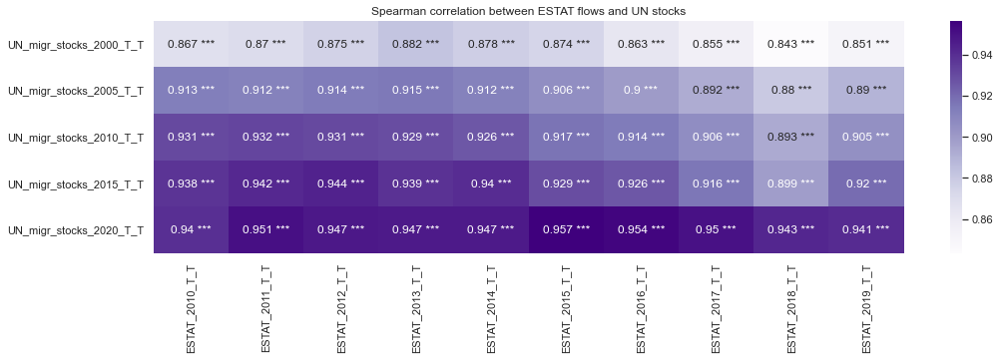

In [42]:
plt.figure(figsize=(15,4))
sns.heatmap(ESTAT_flow_stock_corr, cmap="Purples", annot=matr_ESTAT_flow_stock_corr, fmt='')
plt.title('Spearman correlation between ESTAT flows and UN stocks')
plt.show()

### 7.3. Pearson correlation between UN and EUROSTAT yearly population measurements

In [43]:
pop1=[]
pop2=[]
for i in range(2010,2022):
    pop1.append(f'UN_destination_pop_{str(i)}')
    pop2.append(f'ESTAT_destination_pop_{str(i)}')

In [44]:
pop_corr, x_axis_labels, y_axis_labels = computeCorr(pop1, pop2, 'pearson')
matr_pop = createCorrMatrix(pop1, pop2, pearsonr_pval)

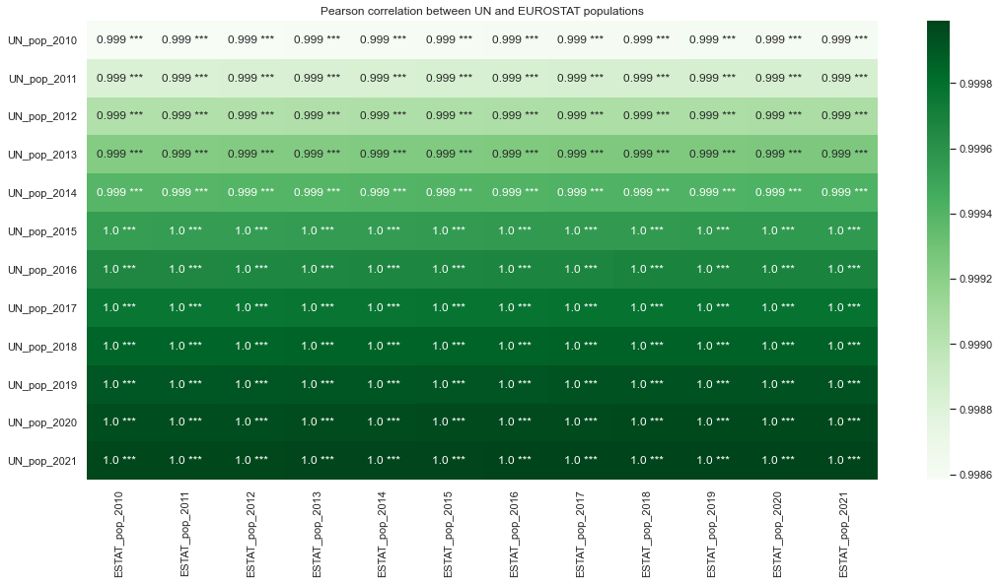

In [45]:
plt.figure(figsize=(16,8))
sns.heatmap(pop_corr, cmap="Greens", annot=matr_pop, fmt='', xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.title('Pearson correlation between UN and EUROSTAT populations')
plt.show()